# SVM и его ядра
__Суммарное количество баллов: 9__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][MS][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
import numpy as np
import copy
from cvxopt import spmatrix, matrix, solvers
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_moons, make_blobs
from typing import NoReturn, Callable, Tuple

solvers.options['show_progress'] = False

In [2]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [3]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P = 
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\ 
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C 
    \end{array}
\right] \\ 
 G = 
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1 
    \end{array}
\right] $

In [4]:
class SVMQPFactory:
    """
    Класс для создания матриц задачи квадратичного программирования SVM
    """    
    
    def create_P(self, P_size: int, I_size: int) -> matrix:
        P = np.zeros((P_size, P_size))
        P[np.arange(I_size), np.arange(I_size)] = 1
        return matrix(P)
    
    def create_q(self, C: float, zeros_size: int, C_size: int) -> matrix:
        q = np.block([np.zeros(zeros_size), np.repeat(C, C_size)])
        return matrix(q)
    
    def create_G(self, X: np.ndarray, y: np.ndarray, I_size: int) -> matrix:
        y = y.reshape(-1, 1)
        
        G = np.block([
            [np.zeros(X.shape), np.zeros((X.shape[0], 1)), -np.identity(I_size)],
            [           -y * X,                        -y, -np.identity(I_size)]
        ])

        return matrix(G)
    
    
    def create_h(self, zeros_size: int, ones_size: int) -> matrix:
        h = np.block([np.zeros(zeros_size) , -np.ones(ones_size)])
        return matrix(h)

In [5]:
class LinearSVM:
    def __init__(self, C: float):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        
        """
        self.C = C
        self.support = None
        self.factory = SVMQPFactory()
        

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        
        objects_count, features_count = X.shape
        x_size = objects_count + features_count + 1
        P = self.factory.create_P(x_size, features_count)
        q = self.factory.create_q(self.C, features_count + 1, objects_count)
        G = self.factory.create_G(X, y, objects_count)
        h = self.factory.create_h(objects_count, objects_count)
        qp_solution = np.array(solvers.qp(P, q, G=G, h=h)['x']).squeeze()
        self.w = qp_solution[:(features_count + 1)]
        margins = self.decision_function(X) * y
        self.support = np.where(margins <= 1)[0]
        
        
    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        
        w, w0 = self.w[:-1], self.w[-1]
        value = X @ w + w0
        return value   


    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

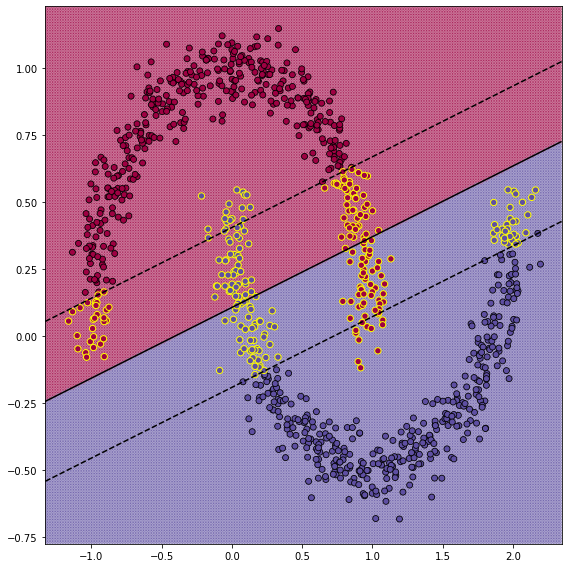

CPU times: user 6.49 s, sys: 1.66 s, total: 8.14 s
Wall time: 2.6 s


In [6]:
%%time
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

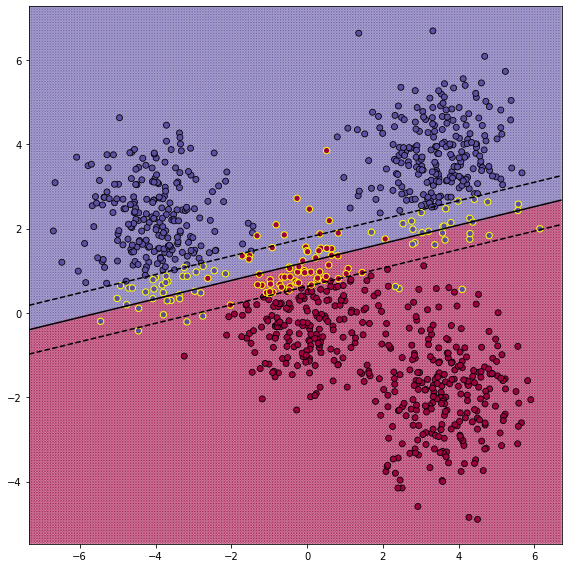

CPU times: user 6.22 s, sys: 1.69 s, total: 7.91 s
Wall time: 2.93 s


In [7]:
%%time
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [8]:
def get_polynomial_kernel(c=1, power=2):
    "Возвращает полиномиальное ядро с заданной константой и степенью"
    
    def scalar_product(X, Y):
        return (X @ Y.T + c) ** power
        
    return scalar_product
    

def get_gaussian_kernel(sigma=1.):
    "Возвращает ядро Гаусса с заданным коэффицинтом сигма"
    
    def scalar_product(X, Y):
            
        result = []
        for x in X:
            norm_square = np.sum((x - Y) ** 2, axis=Y.ndim - 1)
            result.append(np.exp(-norm_square / (2 * sigma ** 2)))
            
        return np.array(result)
    
    return scalar_product

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P = 
\left[ y_i y_j K(x_i, x_j) \right] \\ 
q = \left[ -1
\right] \\ 
 G = 
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0 
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [9]:
class KernelSVMQPFactory:
    """
    Класс для создания матриц задачи квадратичного программирования Kernel SVM
    """   
    
    def create_P(self, X: np.ndarray, y: np.ndarray, kernel: Callable) -> matrix:
        P = (y @ y.T) * kernel(X, X) 
        return matrix(P)
    
    
    def create_q(self, q_size: int) -> matrix:
        q = -np.ones(q_size)
        return matrix(q)
    
    
    def create_G(self, I_size: int) -> matrix:
        G = np.block([
            [np.identity(I_size)],
            [-np.identity(I_size)]
        ])
        
        return matrix(G)
    
    
    def create_h(self, C: float, C_size: int, zeros_size: int) -> matrix:
        h = np.block([np.repeat(C, C_size), np.zeros(zeros_size)])
        return matrix(h)
    
    
    def create_b(self) -> matrix:
        return matrix(0, (1, 1), 'd')
    
    
    def create_A(self, y: np.ndarray) -> matrix:
        return matrix(y, (1, y.shape[0]), 'd')

In [10]:
class KernelSVM:
    def __init__(self, C: float, kernel: Callable):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        kernel : Callable
            Функция ядра.
        
        """
        self.C = C
        self.kernel = kernel
        self.support = None
        self.factory = KernelSVMQPFactory()

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        
        y = y.reshape(-1, 1)
        self.X_train = X
        objects_count, features_count = X.shape
        P = self.factory.create_P(X, y, self.kernel)
        q = self.factory.create_q(objects_count)
        G = self.factory.create_G(objects_count)
        h = self.factory.create_h(self.C, objects_count, objects_count)
        b = self.factory.create_b()
        A = self.factory.create_A(y)
        self.alpha = np.array(solvers.qp(P, q, G=G, h=h, b=b, A=A)['x']).reshape(-1, 1)
        self.w = self.alpha * y
        self.w0 = (np.sum(y) - np.sum(self.w.T @ self.kernel(X, X).T)) / len(X)
        margins = self.decision_function(X) * y.squeeze()
        self.support = np.where(margins <= 1)[0]


    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        
        sums = (self.w.T @ self.kernel(X, self.X_train).T).squeeze()
        return sums + self.w0
    

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        
        return np.sign(self.decision_function(X))

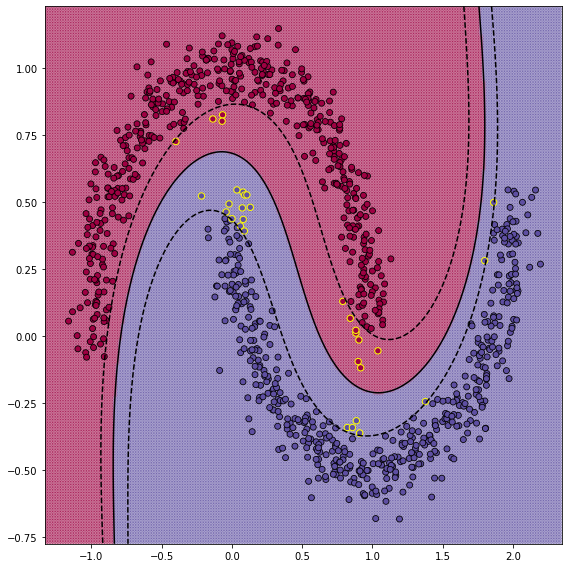

CPU times: user 11.6 s, sys: 4.09 s, total: 15.6 s
Wall time: 6.92 s


In [11]:
%%time
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

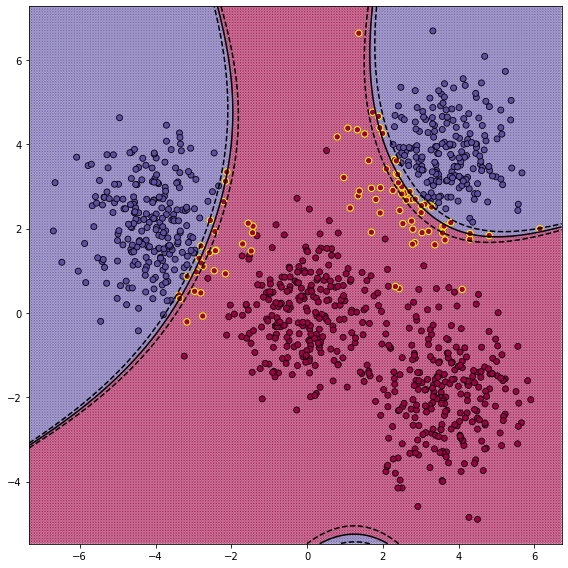

CPU times: user 14 s, sys: 4.71 s, total: 18.7 s
Wall time: 6.91 s


In [12]:
%%time
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

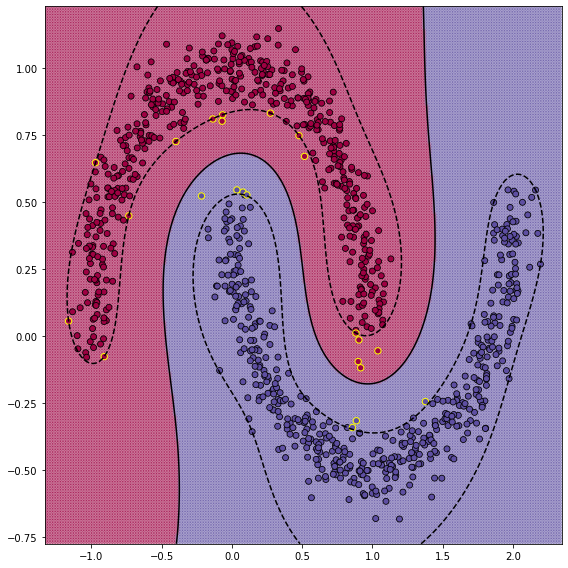

CPU times: user 11.3 s, sys: 2.23 s, total: 13.5 s
Wall time: 7.23 s


In [13]:
%%time
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

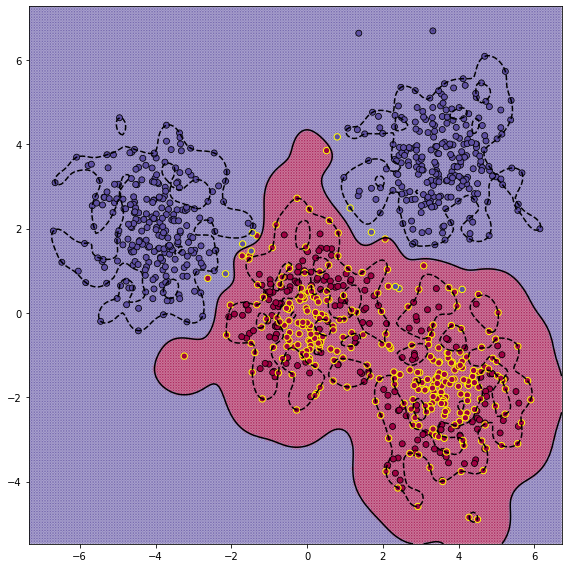

CPU times: user 12.7 s, sys: 2.74 s, total: 15.4 s
Wall time: 7.67 s


In [14]:
%%time
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

В качестве набора данных будем использовать **blobs**.

In [15]:
X, y = generate_dataset(moons=False)

In [16]:
import itertools

In [17]:
def visualize_experiment(X, y, kernel_type, kernel_params): 
    kernels = {
        'poly': get_polynomial_kernel, 
        'gaussian': get_gaussian_kernel,
    }
    keys, values = zip(*kernel_params.items())
    kernel_params = [dict(zip(keys, v)) for v in itertools.product(*values)]
    
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    cm = plt.cm.Spectral
    
    rows = len(kernel_params) // 2
    fig, ax = plt.subplots(nrows=rows, ncols=2, figsize=(14, 7 * rows))
    plt.title(f'SVM с {kernel_type}-ядром')
    
    for i in range(len(kernel_params)):
        row, column = i // 2, i % 2
        params = ', '.join(['{}={!r}'.format(k, v) for k, v in kernel_params[i].items()])
        ax[row, column].set_title(f'Параметры ядра {params}')
        
        kernel = kernels[kernel_type](**kernel_params[i])
        clf = KernelSVM(1, kernel=kernel)
        clf.fit(X, y)
        
        xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
        mesh = np.c_[xx.ravel(), yy.ravel()]
        z_class = clf.predict(mesh).reshape(xx.shape)
        
        # Put the result into a color plot
        ax[row, column].pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

        # Plot hyperplane and margin
        z_dist = clf.decision_function(mesh).reshape(xx.shape)
        ax[row, column].contour(xx, yy, z_dist, [0.0], colors='black')
        ax[row, column].contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

        # Plot also the training points
        y_pred = clf.predict(X)

        ind_support = []
        ind_correct = []
        ind_incorrect = []
        for i in range(len(y)):
            if i in clf.support:
                ind_support.append(i)
            elif y[i] == y_pred[i]:
                ind_correct.append(i)
            else:
                ind_incorrect.append(i)

        ax[row, column].scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], 
                                cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
        ax[row, column].scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], 
                                cmap=cm, alpha=1., marker='*', s=50, edgecolor='black', linewidth=.8)
        ax[row, column].scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], 
                                cmap=cm, alpha=1., edgecolor='yellow', linewidths=1., s=40)

        ax[row, column].set_xlim(xx.min(), xx.max())
        ax[row, column].set_ylim(yy.min(), yy.max())
        fig.tight_layout()
        
    plt.show()

#### Полиномиальное ядро

Для начала исследуем, как влияет параметр **c** при фиксированном **power**.

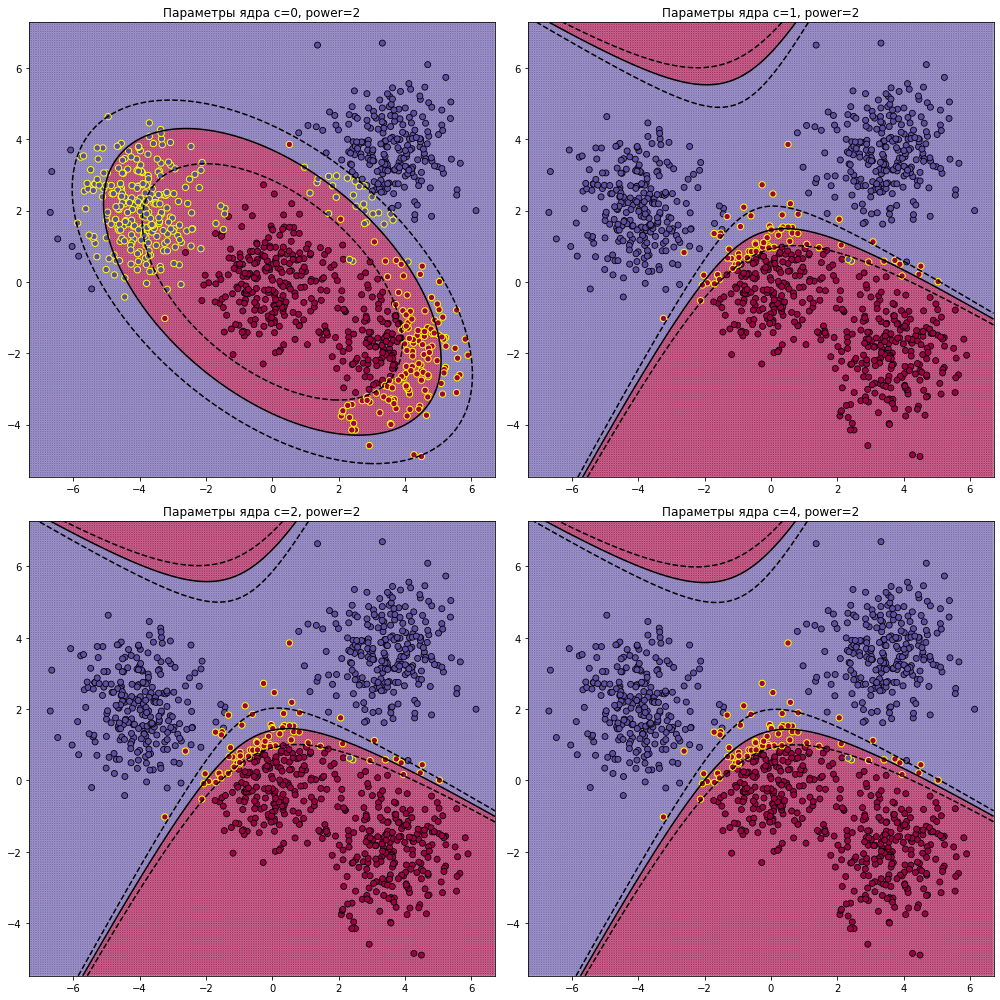

In [19]:
kernel_params = {'c': [0] + [2 ** i for i in range(3)], 'power': [2]}
visualize_experiment(X, y, kernel_type='poly', kernel_params=kernel_params)

Заметная разница лишь в двух случаях: $c = 0$ и $c \neq 0$. Это согласуется с теорией: если $c = 0$, то скалярное произведение берется в пространстве мономов степени строго **power**. Если $c \neq 0$, то в пространстве мономов степени не более **power**.

Исследуем влияние параметра **power**.

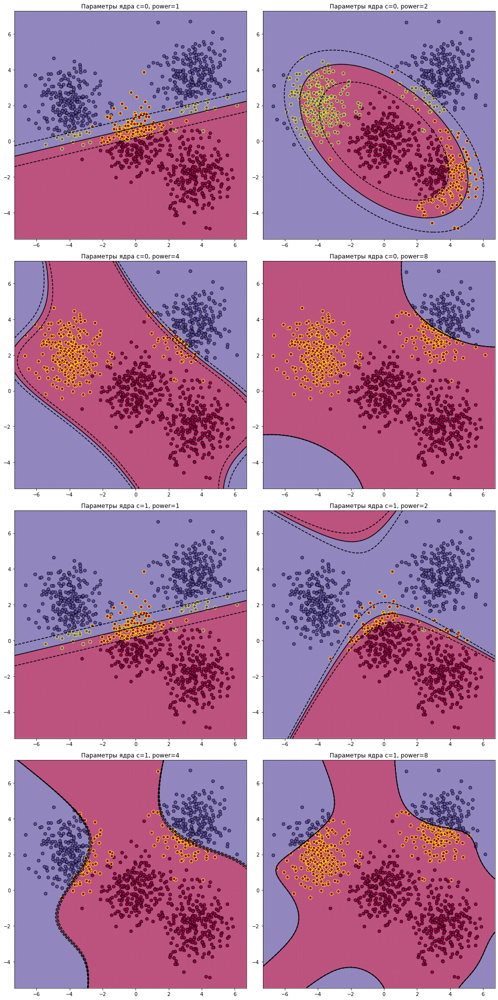

In [20]:
kernel_params = {'c': [0, 1], 'power': [2 ** i for i in range(4)]}
visualize_experiment(X, y, kernel_type='poly', kernel_params=kernel_params)

При увеличении **power** поверхности становятся более сложными.

#### Гауссово ядро

<ipython-input-17-3465a41f8f71>:40: UserWarning: No contour levels were found within the data range.
  ax[row, column].contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')


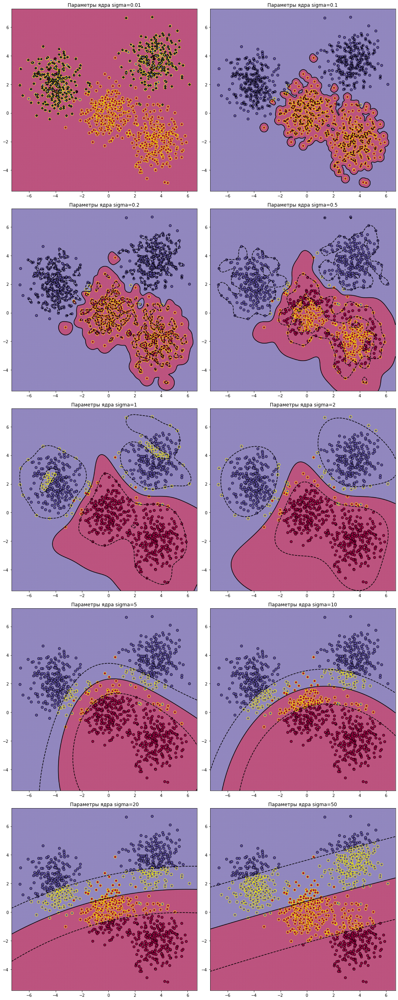

In [21]:
kernel_params = {'sigma': [0.01, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50]}
visualize_experiment(X, y, kernel_type='gaussian', kernel_params=kernel_params)

При уменьшении **sigma** модель становится более сложной, мы видим, что при маленьких **sigma** наблюдается переобучение.